# Spatial Grid

In [2]:
# # 1 compute Distance metrics (Euclidean)
import numpy as np
import matplotlib.pyplot as plt

def cvpr_compare(F1, F2):
    x = F1 - F2
    # Square the differences
    x = x ** 2  
    # Sum the squared differences
    x = np.sum(x)
    # Take the square root to compute the Euclidean distance
    dst = np.sqrt(x) 
    return dst


# 2.Manhattan
# def cvpr_compare(F1, F2):
#     """Calculate Manhattan distance between two feature vectors."""
#     return np.sum(np.abs(F1 - F2))

#.3 cosine
# def cvpr_compare(F1, F2):
#     """Calculate cosine similarity between two feature vectors."""
#     dot_product = np.dot(F1, F2)
#     norm_F1 = np.linalg.norm(F1)
#     norm_F2 = np.linalg.norm(F2)
#     if norm_F1 == 0 or norm_F2 == 0:
#         return 0  # Avoid division by zero
#     return dot_product / (norm_F1 * norm_F2)


In [8]:
import os
import numpy as np
import cv2
import scipy.io as sio
from skimage.feature import local_binary_pattern

# Paths
DATASET_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/msrc_objcategimagedatabase_v2/MSRC_ObjCategImageDatabase_v2'
OUT_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/descriptors'
OUT_SUBFOLDER = 'Spatial_Grid'

# Ensure the output directory exists
os.makedirs(os.path.join(OUT_FOLDER, OUT_SUBFOLDER), exist_ok=True)

# Spatial histogram + texture (LBP) extraction function with default parameters
def extract_grid_histogram_with_texture(img, grid_size=(4, 4), num_bins=16, texture=True, angular_quantization=16):
    
    h, w, _ = img.shape
    grid_h, grid_w = h // grid_size[0], w // grid_size[1]
    
    histograms = []
    
    # Iterate over each grid cell
    for i in range(grid_size[0]):  # Rows
        for j in range(grid_size[1]):  # Columns
            # Extract the grid cell
            cell = img[i * grid_h: (i + 1) * grid_h, j * grid_w: (j + 1) * grid_w]
            
            # Convert cell to 8-bit unsigned integer
            cell_uint8 = (cell * 255).astype(np.uint8)
            
            # Compute color histogram for the cell
            hist = cv2.calcHist([cell_uint8], [0, 1, 2], None, [num_bins]*3, [0, 256, 0, 256, 0, 256])
            hist = cv2.normalize(hist, hist).flatten()  # Flatten the histogram to 1D
            histograms.append(hist)
            
            # Optionally compute texture features (e.g., LBP)
            if texture:
                gray_cell = cv2.cvtColor(cell_uint8, cv2.COLOR_BGR2GRAY)
                lbp = local_binary_pattern(gray_cell, P=8, R=1, method='uniform')
                lbp_hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 11), range=(0, 10))
                lbp_hist = lbp_hist.astype("float")
                lbp_hist /= (lbp_hist.sum() + 1e-6)  # Normalize the histogram
                histograms.append(lbp_hist)
            
            # Optionally apply Gabor filters for angular quantization
            if angular_quantization:
                gabor_kernels = []
                for theta in np.linspace(0, np.pi, angular_quantization, endpoint=False):
                    kernel = cv2.getGaborKernel((9, 9), 4.0, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
                    gabor_kernels.append(kernel)
                
                gabor_responses = []
                for kernel in gabor_kernels:
                    filtered = cv2.filter2D(gray_cell, cv2.CV_8UC3, kernel)
                    gabor_responses.append(np.mean(filtered))
                
                histograms.append(np.array(gabor_responses))
    
    # Concatenate histograms from all cells
    descriptor = np.concatenate(histograms)
    
    return descriptor

# Iterate through all BMP files in the dataset folder
for filename in os.listdir(os.path.join(DATASET_FOLDER, 'Images')):
    if filename.endswith(".bmp"):
        print(f"Processing file {filename}")
        img_path = os.path.join(DATASET_FOLDER, 'Images', filename)
        img = cv2.imread(img_path).astype(np.float64) / 255.0  # Normalize the image to [0,1]
        
        fout = os.path.join(OUT_FOLDER, OUT_SUBFOLDER, filename.replace('.bmp', '.mat'))
        
        # Call the spatial grid histogram extraction function with default parameters
        F = extract_grid_histogram_with_texture(img)
        
        # Save the descriptor to a .mat file
        sio.savemat(fout, {'F': F})

print("Processing complete!")


Processing file 8_22_s.bmp
Processing file 12_29_s.bmp
Processing file 17_20_s.bmp
Processing file 11_5_s.bmp
Processing file 12_15_s.bmp
Processing file 20_1_s.bmp
Processing file 9_16_s.bmp
Processing file 5_27_s.bmp
Processing file 3_26_s.bmp
Processing file 18_23_s.bmp
Processing file 17_27_s.bmp
Processing file 5_29_s.bmp
Processing file 3_28_s.bmp
Processing file 20_12_s.bmp
Processing file 13_7_s.bmp
Processing file 19_21_s.bmp
Processing file 13_22_s.bmp
Processing file 7_18_s.bmp
Processing file 4_26_s.bmp
Processing file 9_12_s.bmp
Processing file 10_18_s.bmp
Processing file 2_25_s.bmp
Processing file 9_15_s.bmp
Processing file 20_10_s.bmp
Processing file 14_28_s.bmp
Processing file 9_23_s.bmp
Processing file 2_13_s.bmp
Processing file 18_13_s.bmp
Processing file 12_14_s.bmp
Processing file 2_16_s.bmp
Processing file 4_25_s.bmp
Processing file 8_1_s.bmp
Processing file 9_21_s.bmp
Processing file 4_20_s.bmp
Processing file 11_3_s.bmp
Processing file 14_18_s.bmp
Processing file

In [70]:
# import os
# import cv2
# import numpy as np
# import scipy.io as sio
# import matplotlib.pyplot as plt
# from random import randint

# # Descriptor and image paths
# DESCRIPTOR_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/descriptors'
# DESCRIPTOR_SUBFOLDER = 'Spatial_Grid'
# IMAGE_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/msrc_objcategimagedatabase_v2/MSRC_ObjCategImageDatabase_v2/'

# # Load all descriptors and categories
# ALLFEAT = []
# ALLFILES = []
# ALLCATEGORIES = []

# for filename in os.listdir(os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER)):
#     if filename.endswith('.mat'):
#         img_path = os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER, filename)
#         img_actual_path = os.path.join(IMAGE_FOLDER, 'Images', filename).replace(".mat", ".bmp")
        
#         # Load the descriptor from the .mat file
#         img_data = sio.loadmat(img_path)
        
#         ALLFILES.append(img_actual_path)
#         ALLFEAT.append(img_data['F'][0])  # Assuming F is a 1D array
        
#         # Extract category from the filename
#         category = int(filename.split('_')[0])
#         ALLCATEGORIES.append(category)

# # Convert ALLFEAT to a numpy array
# ALLFEAT = np.array(ALLFEAT)

# # Pick a random image as the query
# NIMG = ALLFEAT.shape[0]
# queryimg = randint(0, NIMG - 1)

# # Load the query image and its category
# query_image_path = ALLFILES[queryimg]
# query_img = cv2.imread(query_image_path)
# query_img = cv2.resize(query_img, (query_img.shape[1] // 2, query_img.shape[0] // 2))
# query_category = ALLCATEGORIES[queryimg]

# # Compute the distance between the query and all other descriptors
# dst = []
# query = ALLFEAT[queryimg]
# for i in range(NIMG):
#     candidate = ALLFEAT[i]
    
#     # Define the comparison function here if not defined earlier
#     # cvpr_compare should return a numerical distance between two feature vectors
#     distance = cvpr_compare(query, candidate)
#     dst.append((distance, i))

# # Sort the distances and set the number of results to display
# dst.sort(key=lambda x: x[0])
# SHOW = 20  # Number of results to show
# rows = (SHOW + 1) // 5 + ((SHOW + 1) % 5 != 0)  # Calculate rows based on SHOW
# cols = min(SHOW + 1, 5)  # Set a max of 5 columns

# # Display images in a dynamic grid
# fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
# fig.suptitle(f"Query Image and Top {SHOW} Results")

# # Flatten axes if we have a single row or column
# if rows == 1 or cols == 1:
#     axes = np.ravel(axes)
# else:
#     axes = axes.flatten()

# # Show the query image in the first slot
# axes[0].imshow(cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB))
# axes[0].set_title(f"Query - Category: {query_category}")
# axes[0].axis('off')

# # Display the top n result images in the grid
# for i in range(1, SHOW + 1):
#     img_index = dst[i - 1][1]
#     img = cv2.imread(ALLFILES[img_index])
#     img = cv2.resize(img, (img.shape[1] // 2, img.shape[0] // 2))
#     category = ALLCATEGORIES[img_index]
    
#     ax = axes[i]
#     ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#     ax.set_title(f"Result {i} - Category: {category}")
#     ax.axis('off')

# # Hide any extra subplots if SHOW + 1 is less than total grid slots
# for j in range(SHOW + 1, len(axes)):
#     axes[j].axis('off')

# plt.tight_layout()
# plt.show()

# # Precision-Recall Curve Calculation
# precision_list = []
# recall_list = []
# relevant_items = [ALLCATEGORIES[i] for i in range(NIMG) if ALLCATEGORIES[i] == query_category]
# total_relevant = len(relevant_items)

# # Calculate metrics for the top n results
# for n in range(1, NIMG + 1):
#     retrieved = dst[:n]
#     retrieved_categories = [ALLCATEGORIES[i[1]] for i in retrieved]
#     relevant_retrieved = len([cat for cat in retrieved_categories if cat == query_category])
    
#     # Precision and Recall calculations
#     precision = relevant_retrieved / n
#     recall = relevant_retrieved / total_relevant if total_relevant > 0 else 0
    
#     precision_list.append(precision)
#     recall_list.append(recall)

# # Plot Precision-Recall curve
# plt.figure()
# plt.plot(recall_list, precision_list, marker='o')
# plt.title('Precision-Recall Curve')
# plt.xlabel('Recall')
# plt.ylabel('Precision')
# plt.xlim([0, 1])
# plt.ylim([0, 1])
# plt.grid()
# plt.show()


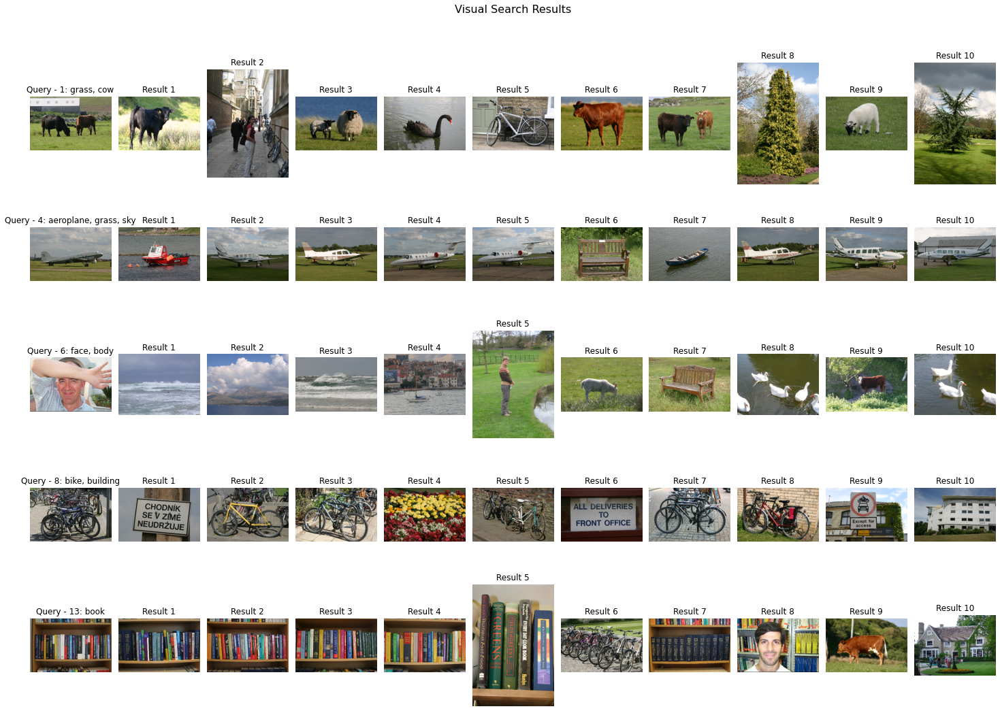

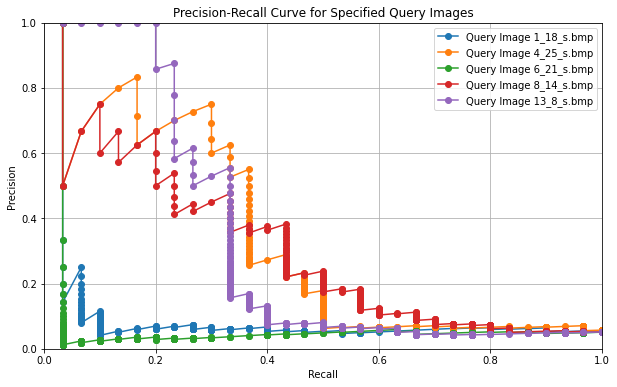

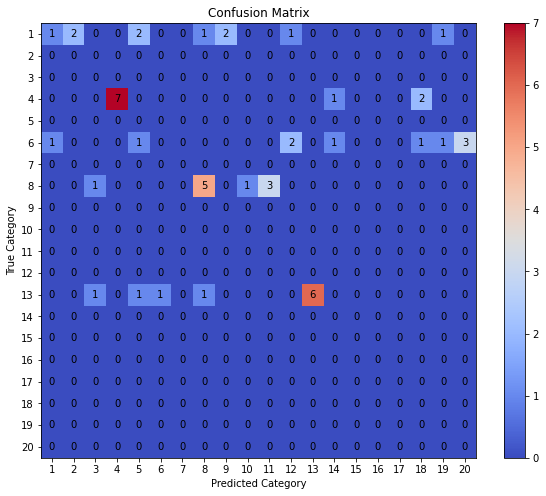

In [9]:
# 4 Specify the exact query images, PR curve, and Confusion Matrix

# Specify the folder containing descriptors
descriptor_folder = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/descriptors/Spatial_Grid'
IMAGES_PER_CATEGORY = 10  # Set this to the number of images to display per query

# Define category mappings
CATEGORY_LABELS = {
    1: "grass, cow",
    2: "tree, grass, sky",
    3: "building, sky",
    4: "aeroplane, grass, sky",
    5: "cow, grass, mount",
    6: "face, body",
    7: "car, building",
    8: "bike, building",
    9: "sheep, grass",
    10: "flower",
    11: "sign",
    12: "bird, sky, grass, water",
    13: "book",
    14: "chair",
    15: "cat",
    16: "dog",
    17: "road, building",
    18: "water, boat",
    19: "body, face",
    20: "water, boat, sky, mount"
}

# Load all descriptors from the specified directory
ALLFEAT = []
ALLFILES = []
ALLCATEGORIES = []

for filename in os.listdir(descriptor_folder):
    if filename.endswith(".mat"):
        file_path = os.path.join(descriptor_folder, filename)
        data = sio.loadmat(file_path)
        ALLFEAT.append(data['F'].flatten())
        ALLFILES.append(filename.replace('.mat', '.bmp'))
        category_num = int(filename.split('_')[0])  # Extracting category number from filename
        ALLCATEGORIES.append(category_num)

ALLFEAT = np.array(ALLFEAT)

QUERY_IMAGES = [
    "1_18_s.bmp", 
    "4_25_s.bmp", 
    "6_21_s.bmp", 
    "8_14_s.bmp", 
    "13_8_s.bmp"
]

# Initialize precision and recall lists
precision_list = []
recall_list = []

# Set up the figure layout
fig, axes = plt.subplots(len(QUERY_IMAGES), IMAGES_PER_CATEGORY + 1, figsize=(20, 3 * len(QUERY_IMAGES)))
fig.suptitle("Visual Search Results", fontsize=16)

# Loop through the list of specific query images
for idx, query_image_name in enumerate(QUERY_IMAGES):
    # Find the index of the query image in the ALLFILES list
    query_idx = None
    for i, filename in enumerate(ALLFILES):
        if filename.endswith(query_image_name):
            query_idx = i
            break
    
    if query_idx is not None:
        query = ALLFEAT[query_idx]

        # Compute distances between the query and all other images
        distances = []
        for i in range(len(ALLFEAT)):
            distance = cvpr_compare(query, ALLFEAT[i])
            distances.append((distance, i))
        
        # Sort distances to find the top results
        distances.sort(key=lambda x: x[0])
        
        # Display the query image
        query_image = cv2.imread(os.path.join(DATASET_FOLDER, 'Images', ALLFILES[query_idx]))
        query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
        
        # Set title to include category number and label
        category_num = ALLCATEGORIES[query_idx]
        category_name = CATEGORY_LABELS[category_num]
        axes[idx, 0].imshow(query_image)
        axes[idx, 0].set_title(f"Query - {category_num}: {category_name}")
        axes[idx, 0].axis('off')
        
        # Show top results for the query
        for i in range(IMAGES_PER_CATEGORY):
            img_index = distances[i + 1][1]  # Skipping the query image itself
            img = cv2.imread(os.path.join(DATASET_FOLDER, 'Images', ALLFILES[img_index]))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            axes[idx, i + 1].imshow(img)
            axes[idx, i + 1].axis('off')
            axes[idx, i + 1].set_title(f"Result {i + 1}")

        # Precision-Recall Calculation for this query image (across the entire dataset)
        relevant_items = [i for i in range(len(ALLFILES)) if ALLCATEGORIES[i] == category_num]
        total_relevant = len(relevant_items)

        precision_category = []
        recall_category = []

        for n in range(1, len(ALLFILES) + 1):
            retrieved = distances[:n]
            retrieved_categories = [ALLCATEGORIES[i[1]] for i in retrieved]
            relevant_retrieved = len([cat for cat in retrieved_categories if cat == category_num])

            # Precision and Recall calculations
            precision = relevant_retrieved / n
            recall = relevant_retrieved / total_relevant if total_relevant > 0 else 0
            
            precision_category.append(precision)
            recall_category.append(recall)

        precision_list.append(precision_category)
        recall_list.append(recall_category)

# Adjust layout and display
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Plot Precision-Recall curve for each of the query images
plt.figure(figsize=(10, 6))
for idx, query_image_name in enumerate(QUERY_IMAGES):
    plt.plot(recall_list[idx], precision_list[idx], marker='o', label=f"Query Image {query_image_name}")

plt.title('Precision-Recall Curve for Specified Query Images')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid()
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt

# Initialize confusion matrix for 20 categories
confusion_matrix = np.zeros((20, 20), dtype=int)  # 20 categories

# Iterate over the query images and update the confusion matrix
for idx, query_image_name in enumerate(QUERY_IMAGES):
    # Get the true category of the current query image
    query_idx = None
    for i, filename in enumerate(ALLFILES):
        if filename.endswith(query_image_name):
            query_idx = i
            break
    
    if query_idx is not None:
        query_category = ALLCATEGORIES[query_idx]  # True category of the query
        
        # Sort distances to find the top results (exclude the query itself)
        distances = []
        for i in range(len(ALLFEAT)):
            distance = cvpr_compare(ALLFEAT[query_idx], ALLFEAT[i])
            distances.append((distance, i))
        
        distances.sort(key=lambda x: x[0])  # Sort by distance (ascending)
        
        # Update confusion matrix: Compare predicted category for top results
        for i in range(IMAGES_PER_CATEGORY):
            predicted_category = ALLCATEGORIES[distances[i + 1][1]]  # Skipping query image itself
            confusion_matrix[query_category - 1, predicted_category - 1] += 1  # Update matrix cell

# Plot the confusion matrix with annotations using the 'coolwarm' color map
plt.figure(figsize=(10, 8))
plt.imshow(confusion_matrix, cmap='coolwarm', interpolation='nearest')  # 'coolwarm' color map
plt.title("Confusion Matrix")
plt.xlabel("Predicted Category")
plt.ylabel("True Category")
plt.colorbar()
plt.xticks(np.arange(20), labels=np.arange(1, 21))
plt.yticks(np.arange(20), labels=np.arange(1, 21))

# Annotate each cell with the numeric value
for i in range(20):
    for j in range(20):
        plt.text(j, i, str(confusion_matrix[i, j]), ha="center", va="center", color="black")

plt.show()


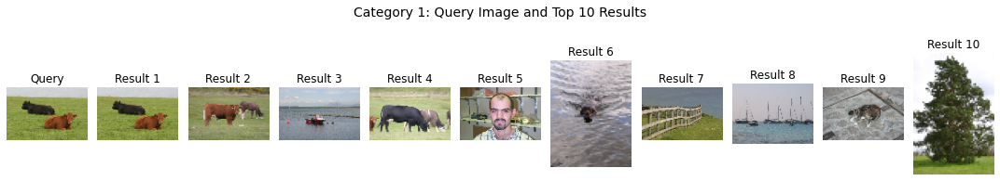

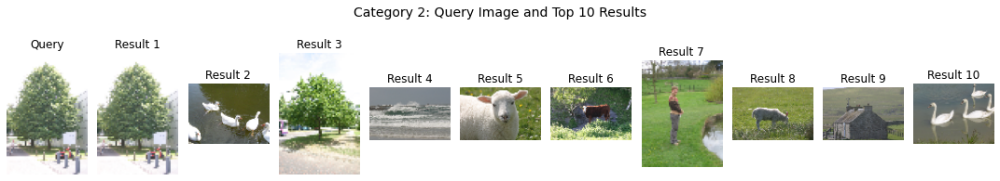

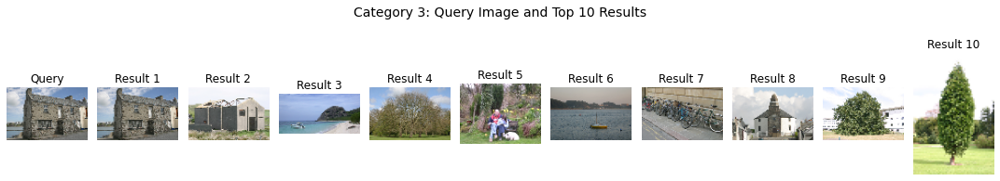

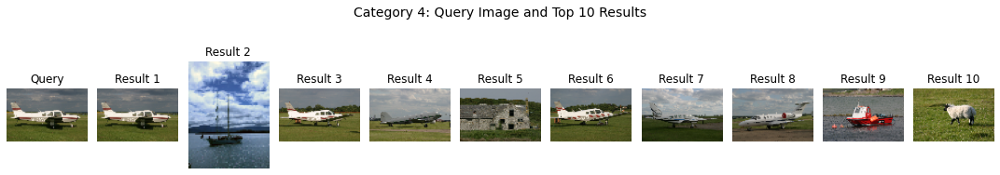

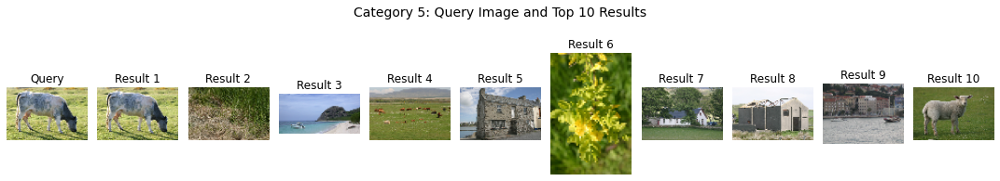

...

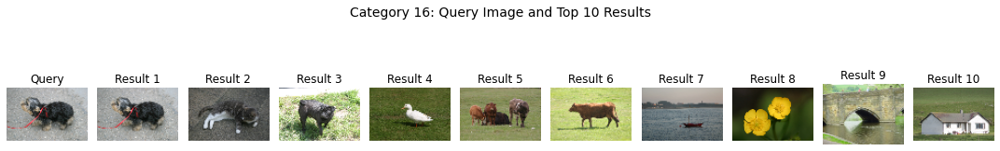

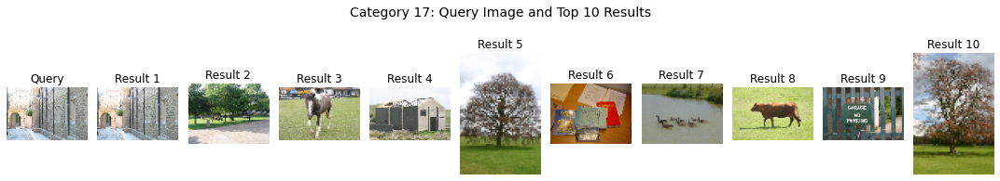

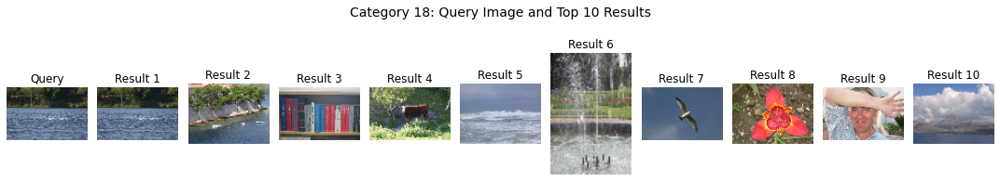

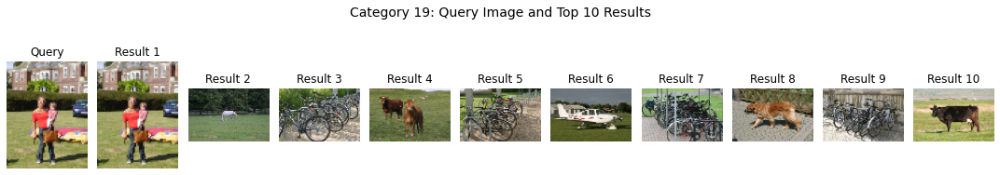

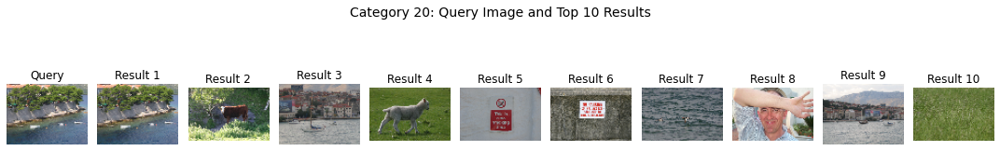

In [10]:
import os
import cv2
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

# Descriptor and image paths
DESCRIPTOR_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/descriptors'
DESCRIPTOR_SUBFOLDER = 'Spatial_Grid'
IMAGE_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/msrc_objcategimagedatabase_v2/MSRC_ObjCategImageDatabase_v2/'
# Define category mappings
CATEGORY_LABELS = {
    1: "grass, cow",
    2: "tree, grass, sky",
    3: "building, sky",
    4: "aeroplane, grass, sky",
    5: "cow, grass, mount",
    6: "face, body",
    7: "car, building",
    8: "bike, building",
    9: "sheep, grass",
    10: "flower",
    11: "sign",
    12: "bird, sky, grass, water",
    13: "book",
    14: "chair",
    15: "cat",
    16: "dog",
    17: "road, building",
    18: "water, boat",
    19: "body, face",
    20: "water, boat, sky, mount"
}

# Load all descriptors and categories
ALLFEAT = []
ALLFILES = []
ALLCATEGORIES = []

for filename in os.listdir(os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER)):
    if filename.endswith('.mat'):
        img_path = os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER, filename)
        img_actual_path = os.path.join(IMAGE_FOLDER, 'Images', filename).replace(".mat", ".bmp")
        
        # Load the descriptor from the .mat file
        img_data = sio.loadmat(img_path)
        
        ALLFILES.append(img_actual_path)
        ALLFEAT.append(img_data['F'][0])  # Assuming F is a 1D array
        
        # Extract category from the filename (first part before the underscore)
        category = int(filename.split('_')[0])
        ALLCATEGORIES.append(category)

# Convert ALLFEAT to a numpy array
ALLFEAT = np.array(ALLFEAT)

# Loop through each unique category to use as a query
unique_categories = sorted(set(ALLCATEGORIES))
for query_category in unique_categories:
    # Select a random image from the current category as the query
    query_indices = [i for i, cat in enumerate(ALLCATEGORIES) if cat == query_category]
    queryimg = np.random.choice(query_indices)
    
    # Load the query image
    query_image_path = ALLFILES[queryimg]
    query_img = cv2.imread(query_image_path)
    query_img = cv2.resize(query_img, (query_img.shape[1] // 4, query_img.shape[0] // 4))
    
    # Compute the distance between the query and all other descriptors
    dst = []
    query = ALLFEAT[queryimg]
    for i in range(ALLFEAT.shape[0]):
        candidate = ALLFEAT[i]
        distance = cvpr_compare(query, candidate)
        dst.append((distance, i))
    
    # Sort the distances and select the top 10 results
    dst.sort(key=lambda x: x[0])
    SHOW = 10  # Number of results to show
    top_results = dst[:SHOW]
    
    # Display the query image and top results in a single row
    fig, axes = plt.subplots(1, SHOW + 1, figsize=(15, 3))
    fig.suptitle(f"Category {query_category}: Query Image and Top {SHOW} Results", fontsize=14)
    
    # Show the query image in the first slot
    axes[0].imshow(cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Query")
    axes[0].axis('off')
    
    # Display the top 10 result images in the row
    for i, (dist, img_index) in enumerate(top_results, start=1):
        img = cv2.imread(ALLFILES[img_index])
        img = cv2.resize(img, (img.shape[1] // 4, img.shape[0] // 4))
        axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[i].set_title(f"Result {i}")
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()


# PCA


In [1]:

# Define category mappings
CATEGORY_LABELS = {
    1: "grass, cow",
    2: "tree, grass, sky",
    3: "building, sky",
    4: "aeroplane, grass, sky",
    5: "cow, grass, mount",
    6: "face, body",
    7: "car, building",
    8: "bike, building",
    9: "sheep, grass",
    10: "flower",
    11: "sign",
    12: "bird, sky, grass, water",
    13: "book",
    14: "chair",
    15: "cat",
    16: "dog",
    17: "road, building",
    18: "water, boat",
    19: "body, face",
    20: "water, boat, sky, mount"
}


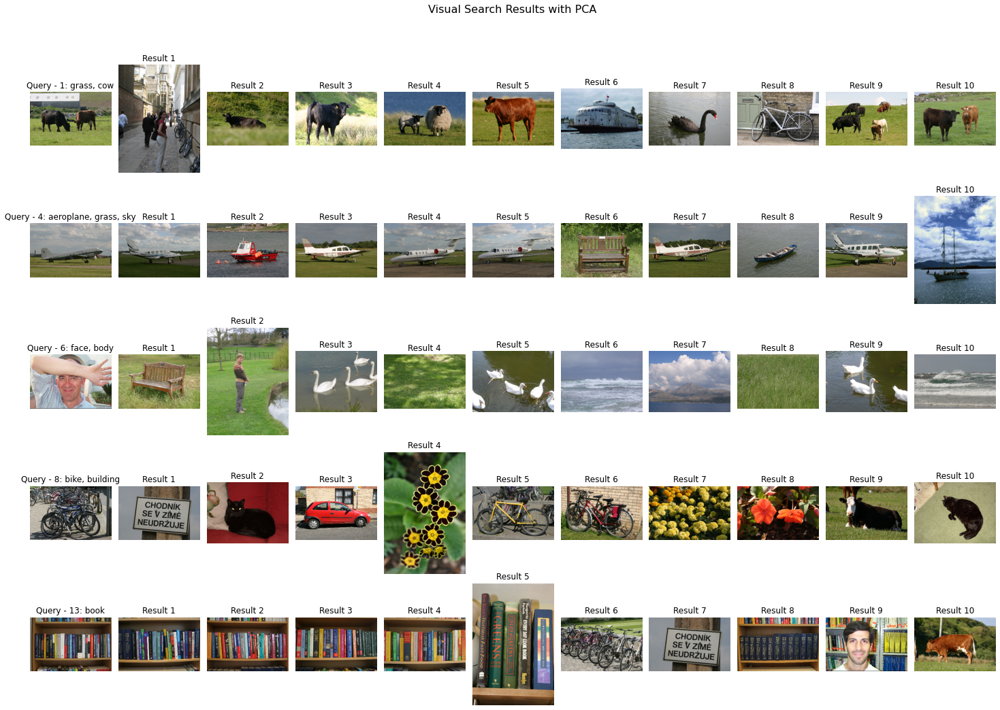

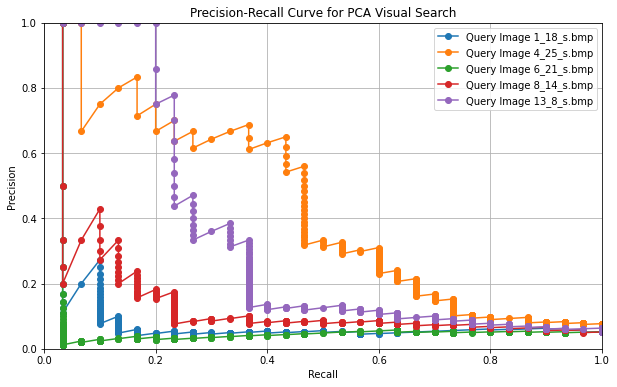

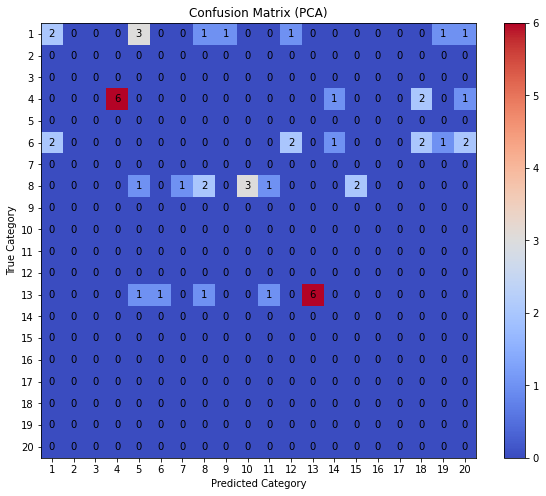

In [2]:
import os
import cv2
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Descriptor and image paths
DESCRIPTOR_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/descriptors'
DESCRIPTOR_SUBFOLDER = 'Spatial_Grid'
IMAGE_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/msrc_objcategimagedatabase_v2/MSRC_ObjCategImageDatabase_v2/'

# Function to calculate distance between two vectors   
def calculate_distance(vec1, vec2, metric='euclidean', cov_inv=None):
    if metric == 'euclidean':
        return np.linalg.norm(vec1 - vec2)
    elif metric == 'manhattan':
        return np.sum(np.abs(vec1 - vec2))
    elif metric == 'cosine':
        return 1 - np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
    elif metric == 'mahalanobis':
        if cov_inv is None:
            raise ValueError("Covariance inverse is required for Mahalanobis distance.")
        delta = vec1 - vec2
        return np.sqrt(np.dot(np.dot(delta.T, cov_inv), delta))
    else:
        raise ValueError(f"Unknown metric: {metric}")


# Distance metric selection
distance_metric = 'euclidean'  # Change this value to 'manhattan', 'cosine', or 'mahalanobis'

# Load all descriptors and categories
ALLFEAT = []
ALLFILES = []
ALLCATEGORIES = []

for filename in os.listdir(os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER)):
    if filename.endswith('.mat'):
        img_path = os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER, filename)
        img_actual_path = os.path.join(IMAGE_FOLDER, 'Images', filename).replace(".mat", ".bmp")
        
        img_data = sio.loadmat(img_path)
        
        ALLFILES.append(img_actual_path)
        ALLFEAT.append(img_data['F'][0])  # Assuming F is a 1D array
        
        category = int(filename.split('_')[0])
        ALLCATEGORIES.append(category)

# Convert ALLFEAT to a numpy array
ALLFEAT = np.array(ALLFEAT)

# Define the number of PCA components
n_components = 50 # Change this number as needed for your experiments

# Apply PCA
pca = PCA(n_components=n_components)
ALLFEAT_PCA = pca.fit_transform(ALLFEAT)

# Calculate the covariance matrix and its inverse for Mahalanobis distance
covariance_matrix = np.cov(ALLFEAT_PCA.T)  # Transpose to get features in columns
covariance_inv = np.linalg.inv(covariance_matrix)  # Inverse of the covariance matrix

# Query images (you can specify these as needed)
QUERY_IMAGES = [
    "1_18_s.bmp",
    "4_25_s.bmp",
    "6_21_s.bmp",
    "8_14_s.bmp",
    "13_8_s.bmp"
]


# Initialize precision and recall lists
precision_list = []
recall_list = []

# Set up the figure layout for showing query and result images
fig, axes = plt.subplots(len(QUERY_IMAGES), 11, figsize=(20, 3 * len(QUERY_IMAGES)))  # Changed 6 to 11
fig.suptitle("Visual Search Results with PCA", fontsize=16)

# Loop through the list of specific query images
for idx, query_image_name in enumerate(QUERY_IMAGES):
    # Find the index of the query image in the ALLFILES list
    query_idx = None
    for i, filename in enumerate(ALLFILES):
        if filename.endswith(query_image_name):
            query_idx = i
            break
    
    if query_idx is not None:
        query = ALLFEAT_PCA[query_idx]

        # Compute distances between the query and all other images using calculate_distance function
        distances = []
        for i in range(len(ALLFEAT_PCA)):
            # Use the selected distance metric
            distance = calculate_distance(query, ALLFEAT_PCA[i], metric=distance_metric, cov_inv=covariance_inv)
            distances.append((distance, i))
        
        # Sort distances to find the top results
        distances.sort(key=lambda x: x[0])
        
        # Display the query image
        query_image = cv2.imread(ALLFILES[query_idx])
        query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
        category_num = ALLCATEGORIES[query_idx]
        category_name = CATEGORY_LABELS.get(category_num, "Unknown")  # Replace CATEGORY_LABELS with your actual labels
        axes[idx, 0].imshow(query_image)
        axes[idx, 0].set_title(f"Query - {category_num}: {category_name}")
        axes[idx, 0].axis('off')
        
        # Show top 10 results for the query
        for i in range(10):  # Changed to show top 10
            img_index = distances[i + 1][1]  # Skipping the query image itself
            img = cv2.imread(ALLFILES[img_index])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[idx, i + 1].imshow(img)
            axes[idx, i + 1].axis('off')
            axes[idx, i + 1].set_title(f"Result {i + 1}")

        # Precision-Recall Calculation for this query image (across the entire dataset)
        relevant_items = [i for i in range(len(ALLFILES)) if ALLCATEGORIES[i] == category_num]
        total_relevant = len(relevant_items)

        precision_category = []
        recall_category = []

        for n in range(1, len(ALLFILES) + 1):
            retrieved = distances[:n]
            retrieved_categories = [ALLCATEGORIES[i[1]] for i in retrieved]
            relevant_retrieved = len([cat for cat in retrieved_categories if cat == category_num])

            # Precision and Recall calculations
            precision = relevant_retrieved / n
            recall = relevant_retrieved / total_relevant if total_relevant > 0 else 0
            
            precision_category.append(precision)
            recall_category.append(recall)

        precision_list.append(precision_category)
        recall_list.append(recall_category)

# Adjust layout and display
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Plot Precision-Recall curve for each of the query images
plt.figure(figsize=(10, 6))
for idx, query_image_name in enumerate(QUERY_IMAGES):
    plt.plot(recall_list[idx], precision_list[idx], marker='o', label=f"Query Image {query_image_name}")

plt.title('Precision-Recall Curve for PCA Visual Search')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid()
plt.legend()
plt.show()

# Initialize confusion matrix for 20 categories
confusion_matrix = np.zeros((20, 20), dtype=int)  # 20 categories

# Iterate over the query images and update the confusion matrix
for idx, query_image_name in enumerate(QUERY_IMAGES):
    query_idx = None
    for i, filename in enumerate(ALLFILES):
        if filename.endswith(query_image_name):
            query_idx = i
            break
    
    if query_idx is not None:
        query_category = ALLCATEGORIES[query_idx]  # True category of the query
        
        # Sort distances to find the top results (exclude the query itself)
        distances = []
        for i in range(len(ALLFEAT_PCA)):
            distance = calculate_distance(ALLFEAT_PCA[query_idx], ALLFEAT_PCA[i], metric=distance_metric, cov_inv=covariance_inv)
            distances.append((distance, i))
        
        distances.sort(key=lambda x: x[0])  # Sort by distance (ascending)
        
        # Update confusion matrix: Compare predicted category for top results
        for i in range(10):  
            predicted_category = ALLCATEGORIES[distances[i + 1][1]]  # Skipping query image itself
            confusion_matrix[query_category - 1, predicted_category - 1] += 1  # Update matrix cell

# Plot the confusion matrix with annotations
plt.figure(figsize=(10, 8))
plt.imshow(confusion_matrix, cmap='coolwarm', interpolation='nearest')  # 'coolwarm' color map
plt.title("Confusion Matrix (PCA)")
plt.xlabel("Predicted Category")
plt.ylabel("True Category")
plt.colorbar()
plt.xticks(np.arange(20), labels=np.arange(1, 21))
plt.yticks(np.arange(20), labels=np.arange(1, 21))

# Annotate each cell with the numeric value
for i in range(20):
    for j in range(20):
        plt.text(j, i, str(confusion_matrix[i, j]), ha="center", va="center", color="black")

plt.show()


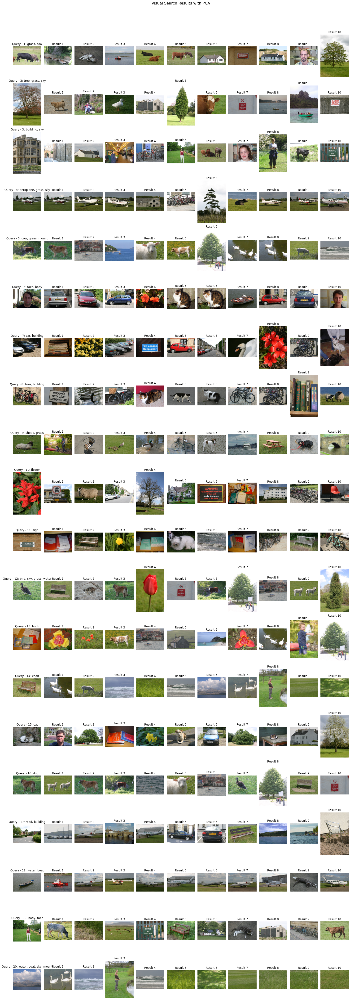

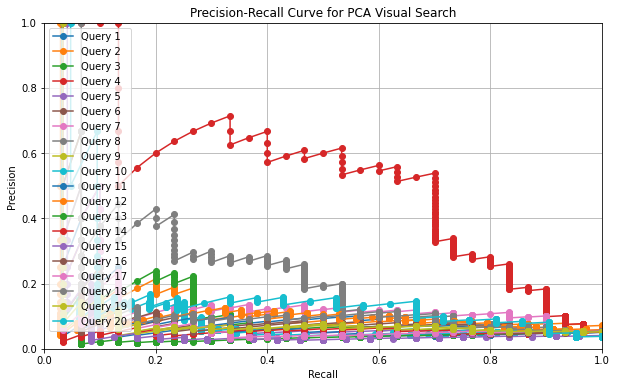

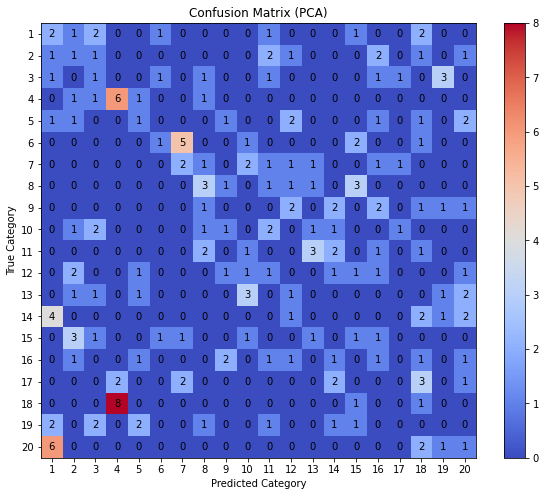

In [4]:
import os
import cv2
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Descriptor and image paths
DESCRIPTOR_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/descriptors'
DESCRIPTOR_SUBFOLDER = 'Spatial_Grid'
IMAGE_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/msrc_objcategimagedatabase_v2/MSRC_ObjCategImageDatabase_v2/'

# Function to calculate distance between two vectors
def calculate_distance(vec1, vec2, metric='euclidean', cov_inv=None):
    if metric == 'euclidean':
        return np.linalg.norm(vec1 - vec2)
    elif metric == 'manhattan':
        return np.sum(np.abs(vec1 - vec2))
    elif metric == 'cosine':
        return 1 - np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
    elif metric == 'mahalanobis':
        if cov_inv is None:
            raise ValueError("Covariance inverse is required for Mahalanobis distance.")
        delta = vec1 - vec2
        return np.sqrt(np.dot(np.dot(delta.T, cov_inv), delta))
    else:
        raise ValueError(f"Unknown metric: {metric}")


# Distance metric selection
distance_metric = 'euclidean'  # Change this value to 'manhattan', 'cosine', or 'mahalanobis'

# Load all descriptors and categories
ALLFEAT = []
ALLFILES = []
ALLCATEGORIES = []

for filename in os.listdir(os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER)):
    if filename.endswith('.mat'):
        img_path = os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER, filename)
        img_actual_path = os.path.join(IMAGE_FOLDER, 'Images', filename).replace(".mat", ".bmp")
        
        img_data = sio.loadmat(img_path)
        
        ALLFILES.append(img_actual_path)
        ALLFEAT.append(img_data['F'][0])  # Assuming F is a 1D array
        
        category = int(filename.split('_')[0])
        ALLCATEGORIES.append(category)

# Convert ALLFEAT to a numpy array
ALLFEAT = np.array(ALLFEAT)

# Define the number of PCA components
n_components = 18  # Change this number as needed for your experiments

# Apply PCA
pca = PCA(n_components=n_components)
ALLFEAT_PCA = pca.fit_transform(ALLFEAT)

# Calculate the covariance matrix and its inverse for Mahalanobis distance
covariance_matrix = np.cov(ALLFEAT_PCA.T)  # Transpose to get features in columns
covariance_inv = np.linalg.inv(covariance_matrix)  # Inverse of the covariance matrix

# Select one query image from each category
QUERY_IMAGES = []
for category_num in range(1, 21):  # Assuming categories are 1 to 20
    for i, category in enumerate(ALLCATEGORIES):
        if category == category_num:
            QUERY_IMAGES.append(ALLFILES[i])
            break  # Only one query image per category

# Initialize precision and recall lists
precision_list = []
recall_list = []

# Set up the figure layout for showing query and result images
fig, axes = plt.subplots(len(QUERY_IMAGES), 11, figsize=(20, 3 * len(QUERY_IMAGES)))  # Changed 6 to 11
fig.suptitle("Visual Search Results with PCA", fontsize=16)

# Loop through the list of specific query images
for idx, query_image_path in enumerate(QUERY_IMAGES):
    # Find the index of the query image in the ALLFILES list
    query_idx = ALLFILES.index(query_image_path)
    query = ALLFEAT_PCA[query_idx]

    # Compute distances between the query and all other images using calculate_distance function
    distances = []
    for i in range(len(ALLFEAT_PCA)):
        # Use the selected distance metric
        distance = calculate_distance(query, ALLFEAT_PCA[i], metric=distance_metric, cov_inv=covariance_inv)
        distances.append((distance, i))
    
    # Sort distances to find the top results
    distances.sort(key=lambda x: x[0])
    
    # Display the query image
    query_image = cv2.imread(ALLFILES[query_idx])
    query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
    category_num = ALLCATEGORIES[query_idx]
    category_name = CATEGORY_LABELS.get(category_num, "Unknown")  # Replace CATEGORY_LABELS with your actual labels
    axes[idx, 0].imshow(query_image)
    axes[idx, 0].set_title(f"Query - {category_num}: {category_name}")
    axes[idx, 0].axis('off')
    
    # Show top 10 results for the query
    for i in range(10):  # Changed to show top 10
        img_index = distances[i + 1][1]  # Skipping the query image itself
        img = cv2.imread(ALLFILES[img_index])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[idx, i + 1].imshow(img)
        axes[idx, i + 1].axis('off')
        axes[idx, i + 1].set_title(f"Result {i + 1}")

    # Precision-Recall Calculation for this query image (across the entire dataset)
    relevant_items = [i for i in range(len(ALLFILES)) if ALLCATEGORIES[i] == category_num]
    total_relevant = len(relevant_items)

    precision_category = []
    recall_category = []

    for n in range(1, len(ALLFILES) + 1):
        retrieved = distances[:n]
        retrieved_categories = [ALLCATEGORIES[i[1]] for i in retrieved]
        relevant_retrieved = len([cat for cat in retrieved_categories if cat == category_num])

        # Precision and Recall calculations
        precision = relevant_retrieved / n
        recall = relevant_retrieved / total_relevant if total_relevant > 0 else 0
        
        precision_category.append(precision)
        recall_category.append(recall)

    precision_list.append(precision_category)
    recall_list.append(recall_category)

# Adjust layout and display
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Plot Precision-Recall curve for each of the query images
# Plot Precision-Recall curve for each of the query images
plt.figure(figsize=(10, 6))
for idx, query_image_name in enumerate(QUERY_IMAGES):
    query_idx = None
    for i, filename in enumerate(ALLFILES):
        if filename.endswith(query_image_name):
            query_idx = i
            break

    if query_idx is not None:
        category_num = ALLCATEGORIES[query_idx]  # Get the query category number

        # Plot the precision-recall curve for this query image
        plt.plot(recall_list[idx], precision_list[idx], marker='o', label=f"Query {category_num}")

plt.title('Precision-Recall Curve for PCA Visual Search')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid()
plt.legend()
plt.show()



# Initialize confusion matrix for 20 categories
confusion_matrix = np.zeros((20, 20), dtype=int)  # 20 categories

# Iterate over the query images and update the confusion matrix
for idx, query_image_path in enumerate(QUERY_IMAGES):
    query_idx = ALLFILES.index(query_image_path)  # Find the query index
    query_category = ALLCATEGORIES[query_idx]  # True category of the query
    
    # Sort distances to find the top results (exclude the query itself)
    distances = []
    for i in range(len(ALLFEAT_PCA)):
        distance = calculate_distance(ALLFEAT_PCA[query_idx], ALLFEAT_PCA[i], metric=distance_metric, cov_inv=covariance_inv)
        distances.append((distance, i))
    
    distances.sort(key=lambda x: x[0])  # Sort by distance (ascending)
    
    # Update confusion matrix: Compare predicted category for top results
    for i in range(10):  
        predicted_category = ALLCATEGORIES[distances[i + 1][1]]  # Skipping query image itself
        confusion_matrix[query_category - 1, predicted_category - 1] += 1  # Update matrix cell

# Plot the confusion matrix with annotations
plt.figure(figsize=(10, 8))
plt.imshow(confusion_matrix, cmap='coolwarm', interpolation='nearest')  # 'coolwarm' color map
plt.title("Confusion Matrix (PCA)")
plt.xlabel("Predicted Category")
plt.ylabel("True Category")
plt.colorbar()
plt.xticks(np.arange(20), labels=np.arange(1, 21))
plt.yticks(np.arange(20), labels=np.arange(1, 21))

# Annotate each cell with the numeric value
for i in range(20):
    for j in range(20):
        plt.text(j, i, str(confusion_matrix[i, j]), ha="center", va="center", color="black")

plt.show()
